In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.7/40.7 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.9/756.9 kB 27.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [18]:
from ultralytics import YOLO
import os
import cv2
import supervision as sv
import numpy as np

In [3]:
model = YOLO('yolov8n.yaml')

In [6]:
model.train(data='/kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/data.yaml', epochs=100)

Ultralytics YOLOv8.2.16 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, sav

wandb: Currently logged in as: mahamoftah19 (mahamoftah). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/train/labels... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<00:00, 982.17it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/valid/labels... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<00:00, 719.90it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.49G      4.387      4.888      4.359         12        640: 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


                   all         26        128    0.00155     0.0471   0.000974   0.000555

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.37G      4.177      4.653      4.273         18        640: 100%|██████████| 10/10 [00:01<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         26        128     0.0016     0.0309    0.00103   0.000432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.37G      3.961      4.465      4.131         16        640: 100%|██████████| 10/10 [00:01<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

                   all         26        128    0.00157     0.0522     0.0011   0.000361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.37G      3.567      4.247      3.885         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


                   all         26        128    0.00157     0.0471   0.000903   0.000402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.37G      3.353       4.08      3.709          6        640: 100%|██████████| 10/10 [00:01<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


                   all         26        128    0.00156     0.0471   0.000837   0.000357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.38G      3.266      3.776      3.546         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]

                   all         26        128    0.00156     0.0522   0.000883   0.000305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.36G      3.278      3.712      3.356          8        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


                   all         26        128   0.000821     0.0258   0.000496   0.000133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.38G      3.221      3.574      3.296         20        640: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


                   all         26        128    0.00131     0.0309    0.00104    0.00034

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.37G      3.057      3.493      3.119          6        640: 100%|██████████| 10/10 [00:01<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]

                   all         26        128    0.00132     0.0309   0.000791   0.000348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.37G      3.091      3.378      3.103         25        640: 100%|██████████| 10/10 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]

                   all         26        128    0.00128     0.0471   0.000758   0.000321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.37G      3.004      3.332      3.038         14        640: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


                   all         26        128    0.00302      0.159    0.00534    0.00108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.37G      2.968      3.198       2.97         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]

                   all         26        128     0.0497     0.0374     0.0284    0.00481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.37G      2.837      3.261      2.949          8        640: 100%|██████████| 10/10 [00:01<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         26        128     0.0646      0.151     0.0675     0.0249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.37G      2.808      3.107        2.9         16        640: 100%|██████████| 10/10 [00:01<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


                   all         26        128      0.177      0.218     0.0915     0.0214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.37G      2.787      2.931      2.856         14        640: 100%|██████████| 10/10 [00:01<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


                   all         26        128       0.26      0.147     0.0984      0.029

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.37G      2.743      3.014      2.827         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]

                   all         26        128     0.0525     0.0954     0.0182    0.00608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.37G      2.674      2.886      2.791         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


                   all         26        128      0.225      0.259       0.13     0.0307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.37G      2.637      2.818      2.732         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]

                   all         26        128        0.2      0.044      0.056     0.0147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.38G      2.706      2.756      2.715         14        640: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         26        128      0.134      0.162     0.0858     0.0258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.37G      2.721      2.732      2.723         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


                   all         26        128      0.175      0.355      0.148     0.0482

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.37G      2.624      2.682      2.676         27        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

                   all         26        128      0.181      0.228      0.167     0.0551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.37G      2.557      2.553      2.601         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]

                   all         26        128      0.205      0.216      0.145     0.0445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.37G       2.55      2.529      2.556         16        640: 100%|██████████| 10/10 [00:01<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


                   all         26        128       0.22      0.399      0.207     0.0632

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.37G      2.524      2.539      2.567         19        640: 100%|██████████| 10/10 [00:01<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]

                   all         26        128      0.286      0.402       0.22     0.0543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.37G      2.486      2.481      2.528         20        640: 100%|██████████| 10/10 [00:01<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


                   all         26        128      0.274      0.359      0.235     0.0652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.37G      2.471      2.426      2.503         18        640: 100%|██████████| 10/10 [00:01<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


                   all         26        128      0.194      0.359      0.158     0.0506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.37G      2.432      2.316       2.49         15        640: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]

                   all         26        128      0.277      0.344      0.266     0.0744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.37G      2.423      2.379      2.406         14        640: 100%|██████████| 10/10 [00:01<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


                   all         26        128      0.428      0.319      0.269     0.0821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.37G      2.359      2.288      2.426         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


                   all         26        128      0.316      0.315      0.266     0.0754

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.37G      2.345      2.255      2.407         10        640: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


                   all         26        128      0.249      0.293      0.259     0.0763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.37G      2.418      2.257      2.424         15        640: 100%|██████████| 10/10 [00:01<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]

                   all         26        128      0.295      0.282       0.22     0.0881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.37G      2.359      2.324      2.358         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

                   all         26        128      0.249      0.203      0.204     0.0695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.37G      2.296      2.173      2.359         21        640: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


                   all         26        128      0.347      0.286      0.224     0.0763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.37G      2.292      2.131      2.304         20        640: 100%|██████████| 10/10 [00:01<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


                   all         26        128      0.424      0.166       0.17     0.0584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.37G      2.275      2.139      2.313         18        640: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]

                   all         26        128      0.457      0.397      0.393      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.37G      2.234      2.147      2.326         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]

                   all         26        128      0.552      0.336      0.342      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.37G      2.169       2.07      2.285         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

                   all         26        128      0.411      0.197      0.217      0.093



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.37G      2.185      2.077       2.31         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]

                   all         26        128      0.375      0.423      0.389      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.37G      2.239      2.004      2.251         16        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


                   all         26        128      0.403       0.42      0.384      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.37G      2.182      1.996      2.233         18        640: 100%|██████████| 10/10 [00:01<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]

                   all         26        128      0.441       0.34      0.374      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.37G      2.172      1.983       2.23         18        640: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.65it/s]

                   all         26        128      0.519       0.42      0.413      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.37G      2.196      1.946      2.241         17        640: 100%|██████████| 10/10 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]

                   all         26        128      0.535      0.437      0.459      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.37G      2.154      1.929      2.185         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


                   all         26        128      0.501      0.459      0.458      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.37G      2.093      1.892      2.169         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


                   all         26        128      0.562      0.373      0.459      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.37G      2.098      1.893      2.148         19        640: 100%|██████████| 10/10 [00:01<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


                   all         26        128      0.517      0.438      0.465      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.37G      2.115      1.869      2.161         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

                   all         26        128      0.486      0.479      0.468      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.37G      2.092      1.839      2.168          7        640: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

                   all         26        128        0.5      0.488      0.504      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.37G      2.155      1.843      2.186          9        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]

                   all         26        128      0.572      0.511      0.521      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.37G      2.126      1.837      2.124          9        640: 100%|██████████| 10/10 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


                   all         26        128      0.442      0.385      0.402      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.37G      2.052      1.869      2.112         20        640: 100%|██████████| 10/10 [00:01<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]

                   all         26        128      0.598      0.476      0.487      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.37G      2.029      1.753       2.12         17        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


                   all         26        128      0.496      0.505      0.474      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.37G      2.043      1.776      2.116         16        640: 100%|██████████| 10/10 [00:01<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


                   all         26        128      0.592      0.499      0.511      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.37G      1.987      1.735      2.086         15        640: 100%|██████████| 10/10 [00:01<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]

                   all         26        128      0.568      0.547      0.528      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.37G      2.004       1.77      2.102         15        640: 100%|██████████| 10/10 [00:01<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all         26        128      0.665      0.461      0.525      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.37G      1.986      1.743      2.068         10        640: 100%|██████████| 10/10 [00:01<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

                   all         26        128      0.609      0.494      0.528      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.37G      1.984       1.71      2.038         24        640: 100%|██████████| 10/10 [00:01<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]

                   all         26        128      0.529      0.476      0.545      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.37G      1.962      1.754      2.086          7        640: 100%|██████████| 10/10 [00:01<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

                   all         26        128      0.958      0.349      0.527      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.37G      1.983      1.723      2.047         18        640: 100%|██████████| 10/10 [00:01<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]

                   all         26        128      0.698      0.392      0.493      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.37G      2.008      1.699      2.058         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

                   all         26        128      0.529      0.481      0.473      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.37G      1.883      1.669      2.053         10        640: 100%|██████████| 10/10 [00:01<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]

                   all         26        128      0.612      0.515      0.505      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.37G        1.9      1.608      2.038          9        640: 100%|██████████| 10/10 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


                   all         26        128      0.543      0.563      0.499      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.37G      1.947       1.68      2.029         31        640: 100%|██████████| 10/10 [00:01<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]

                   all         26        128      0.522      0.585      0.506      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.37G       1.84      1.622      1.969          8        640: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


                   all         26        128      0.562      0.515       0.48        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.37G      1.878      1.599      2.008         14        640: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]

                   all         26        128      0.534       0.53      0.552      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.38G      1.863      1.578      1.974         14        640: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


                   all         26        128      0.561      0.562      0.536      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.37G      1.855      1.538      2.023         22        640: 100%|██████████| 10/10 [00:01<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

                   all         26        128      0.698      0.497      0.542      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.37G      1.878      1.591      1.996          7        640: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

                   all         26        128      0.747      0.461      0.579      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.37G      1.858      1.518      1.975          7        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


                   all         26        128      0.646       0.51       0.57       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.37G      1.911      1.614      1.991         17        640: 100%|██████████| 10/10 [00:01<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]

                   all         26        128      0.656      0.606      0.585      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.37G      1.833      1.553      1.927         10        640: 100%|██████████| 10/10 [00:01<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

                   all         26        128      0.597      0.553      0.555      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.37G      1.836      1.537      1.926         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


                   all         26        128      0.621       0.57      0.574       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.37G      1.857      1.572      1.944         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

                   all         26        128      0.695      0.486      0.574      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.37G      1.805      1.516      1.954          8        640: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]

                   all         26        128      0.775      0.475      0.592      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.37G      1.695      1.535      1.902         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]

                   all         26        128      0.616      0.568      0.604      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.37G      1.781      1.513      1.913         11        640: 100%|██████████| 10/10 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


                   all         26        128      0.605      0.569      0.583      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.37G      1.791        1.5        1.9         29        640: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


                   all         26        128      0.618      0.595      0.578      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.37G      1.829      1.539      1.923         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]

                   all         26        128      0.713      0.581      0.606      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.37G      1.729      1.437      1.864          8        640: 100%|██████████| 10/10 [00:01<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

                   all         26        128      0.677      0.574      0.601      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.37G      1.808      1.462      1.925         16        640: 100%|██████████| 10/10 [00:01<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

                   all         26        128      0.739      0.556      0.616      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.37G      1.722      1.441      1.905         10        640: 100%|██████████| 10/10 [00:01<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]

                   all         26        128      0.687      0.589      0.604      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.38G      1.804      1.476      1.919         17        640: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]

                   all         26        128      0.713      0.558       0.59      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.37G      1.736      1.432      1.891         13        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]

                   all         26        128      0.736      0.531      0.585      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.37G      1.696      1.417      1.851         24        640: 100%|██████████| 10/10 [00:01<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


                   all         26        128      0.695      0.527      0.583      0.262

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.37G      1.816       1.43      1.901         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]

                   all         26        128      0.665      0.533      0.588      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.37G      1.673      1.395      1.872         18        640: 100%|██████████| 10/10 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


                   all         26        128      0.664      0.555      0.603      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.37G      1.711      1.407      1.833         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all         26        128      0.622      0.585      0.608      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.37G      1.718      1.395      1.852         22        640: 100%|██████████| 10/10 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


                   all         26        128      0.613      0.547      0.578      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.37G      1.729      1.403       1.85          9        640: 100%|██████████| 10/10 [00:01<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

                   all         26        128      0.622      0.586      0.585      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.37G      1.679      1.403      1.834         20        640: 100%|██████████| 10/10 [00:01<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


                   all         26        128      0.639      0.517      0.581       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.37G        1.7      1.368      1.845          9        640: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.74it/s]

                   all         26        128       0.55       0.57       0.59      0.272


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.37G       1.74      1.391      1.847         12        640: 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]

                   all         26        128      0.604      0.553      0.603      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.37G      1.723      1.366      1.826         16        640: 100%|██████████| 10/10 [00:01<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]

                   all         26        128      0.686      0.527      0.604      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.37G      1.658      1.327      1.817         23        640: 100%|██████████| 10/10 [00:01<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

                   all         26        128      0.588      0.584      0.606      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.37G      1.675      1.345      1.818         15        640: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

                   all         26        128      0.639        0.6      0.609      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.37G      1.641      1.315      1.786         17        640: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


                   all         26        128      0.639      0.585        0.6      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.37G      1.633      1.319      1.803         12        640: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


                   all         26        128      0.625      0.606      0.605      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.37G      1.575      1.284      1.762          8        640: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


                   all         26        128      0.648      0.597        0.6      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.37G      1.718      1.374      1.836         30        640: 100%|██████████| 10/10 [00:01<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

                   all         26        128      0.637      0.595      0.607       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.37G        1.6       1.34      1.807         11        640: 100%|██████████| 10/10 [00:01<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


                   all         26        128      0.675      0.564      0.604      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.37G      1.675      1.327      1.765         24        640: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


                   all         26        128      0.711       0.58      0.623      0.278

100 epochs completed in 0.087 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.3MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.2.16 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
YOLOv8n summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


                   all         26        128      0.713      0.581      0.606      0.287
             Signature         26         31       0.79      0.839      0.864      0.433
                  Text         26         97      0.635      0.323      0.348      0.141
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train3


lr/pg0,▂▃▅▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▂▃▅▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▂▃▅▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▁▁▁▁▂▁▂▃▃▃▄▃▃▅▅▆▆▆▆▆▇▇▆▇▇██████████████
metrics/mAP50-95(B),▁▁▁▁▁▂▁▁▂▃▂▃▃▂▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇██▇█▇▇████
metrics/precision(B),▁▁▁▁▁▂▁▃▃▃▃▅▄▅▆▅▆▆▆▅▆▇▆▆▆▆█▇█▇███▇▇▇▇▇▇█
metrics/recall(B),▁▁▁▁▃▂▂▁▃▅▅▅▄▃▅▆▆▅▆▅▇▆▆▆▇▇▆█▇██▇▇▇▇▇▇███
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▅▅▅▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▁▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f3efc19ba90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [7]:
model.val()

Ultralytics YOLOv8.2.16 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
YOLOv8n summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/valid/labels... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<00:00, 990.88it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.54it/s]


                   all         26        128      0.726      0.581      0.608      0.287
             Signature         26         31      0.804      0.839      0.865      0.434
                  Text         26         97      0.648      0.323       0.35       0.14
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train32


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f3e499a5060>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [8]:
test_images = os.listdir('/kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/test/images')

## **Test on One Sample**

In [9]:
img_path = os.path.join('/kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/test/images', test_images[0])
img = cv2.imread(img_path)
pred = model.predict(source=img)


0: 640x640 1 Signature, 8.5ms
Speed: 4.0ms preprocess, 8.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


In [10]:
pred[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.3828], device='cuda:0')
data: tensor([[7.8292e+01, 3.7161e+02, 2.8468e+02, 4.0785e+02, 3.8284e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([1, 6])
xywh: tensor([[181.4877, 389.7257, 206.3918,  36.2405]], device='cuda:0')
xywhn: tensor([[0.2836, 0.6089, 0.3225, 0.0566]], device='cuda:0')
xyxy: tensor([[ 78.2918, 371.6055, 284.6836, 407.8459]], device='cuda:0')
xyxyn: tensor([[0.1223, 0.5806, 0.4448, 0.6373]], device='cuda:0')

In [11]:
pip install supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 4.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [14]:
detections = sv.Detections.from_ultralytics(pred[0])

In [15]:
detections

Detections(xyxy=array([[     78.292,      371.61,      284.68,      407.85]], dtype=float32), mask=None, confidence=array([    0.38284], dtype=float32), class_id=array([0]), tracker_id=None, data={'class_name': array(['Signature'], dtype='<U9')})

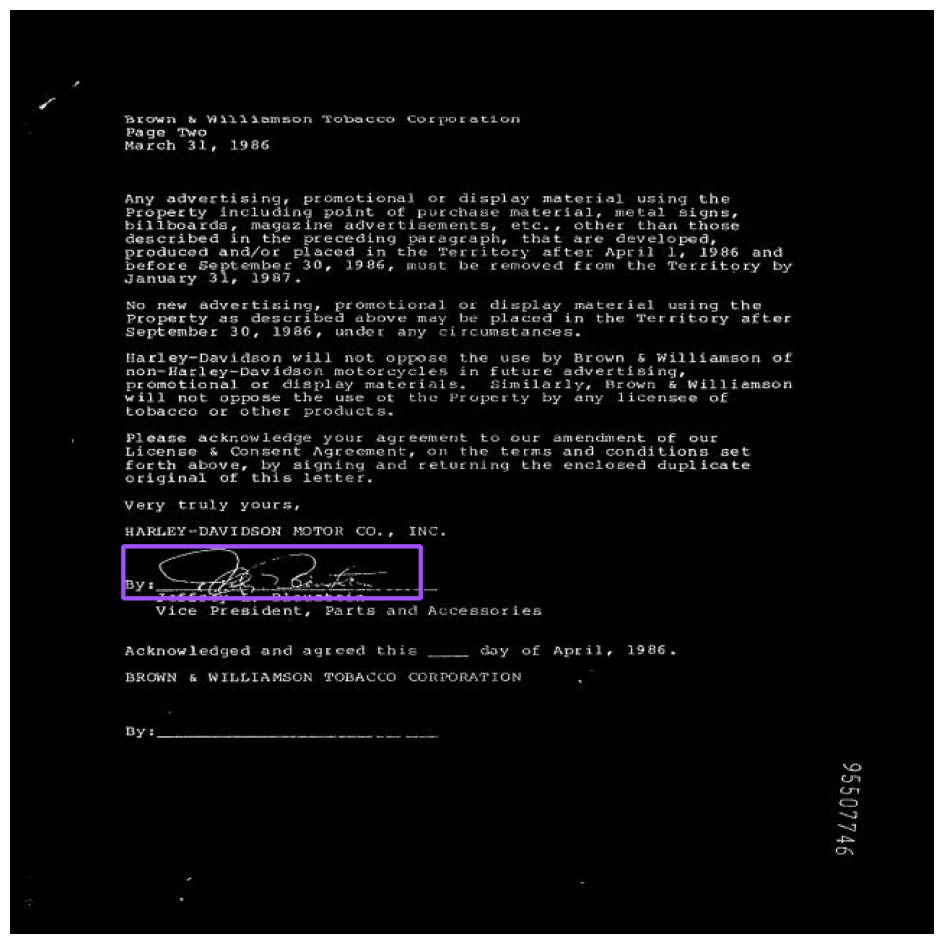

In [16]:
bounding_box_annotator = sv.BoundingBoxAnnotator()

annotated_frame = bounding_box_annotator.annotate(
    scene=img.copy(),
    detections=detections
)

sv.plot_image(annotated_frame)

## **Testing All Test Data**


0: 640x640 1 Signature, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 1 Text, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5671729


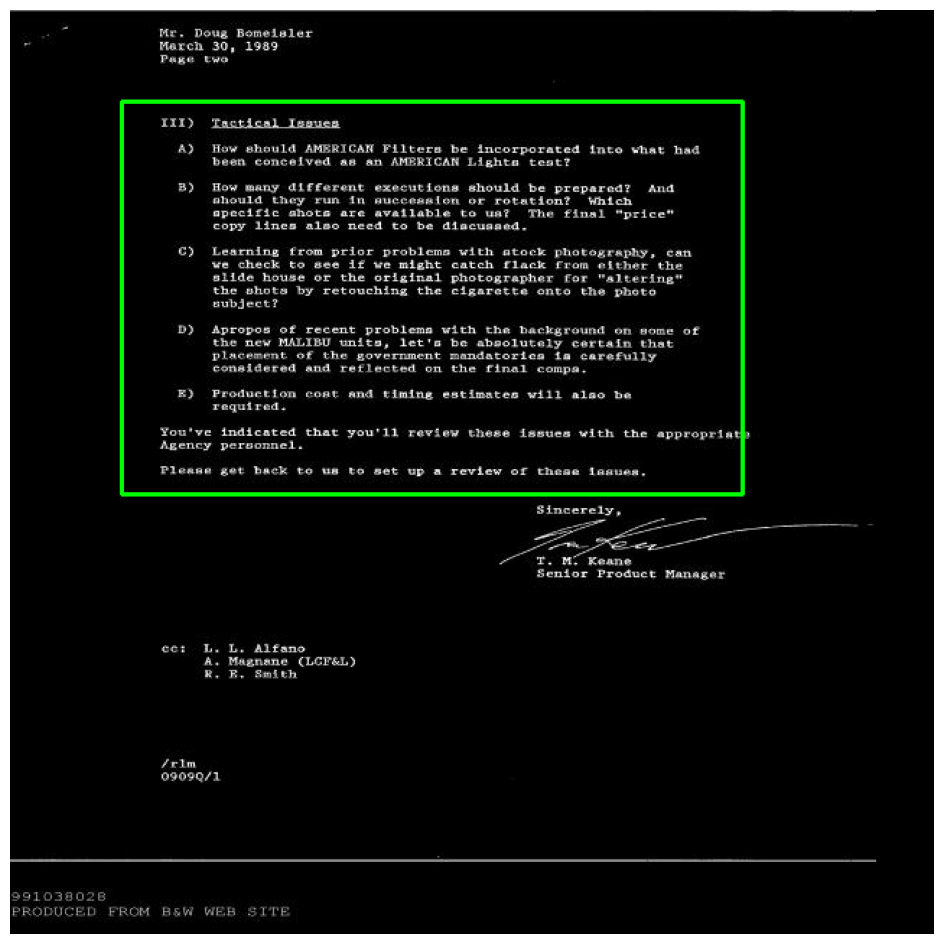


0: 640x640 1 Signature, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.57976085


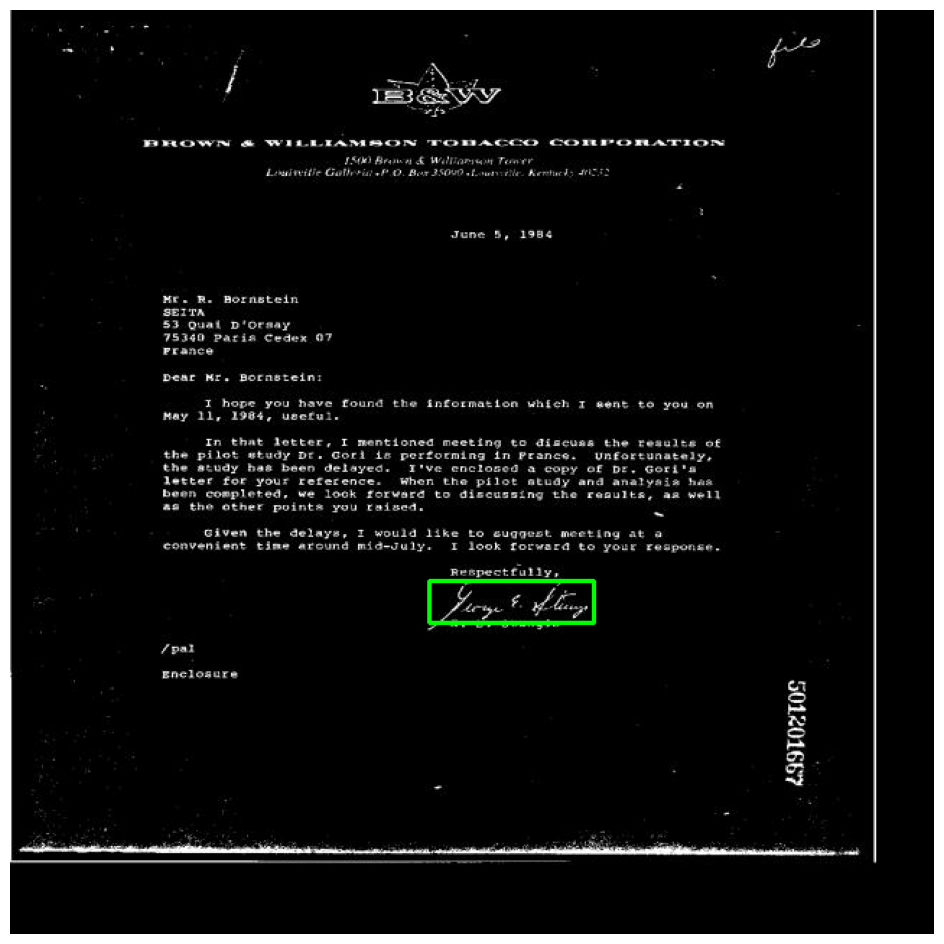


0: 640x640 1 Signature, 6.9ms
Speed: 1.9ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.67701226


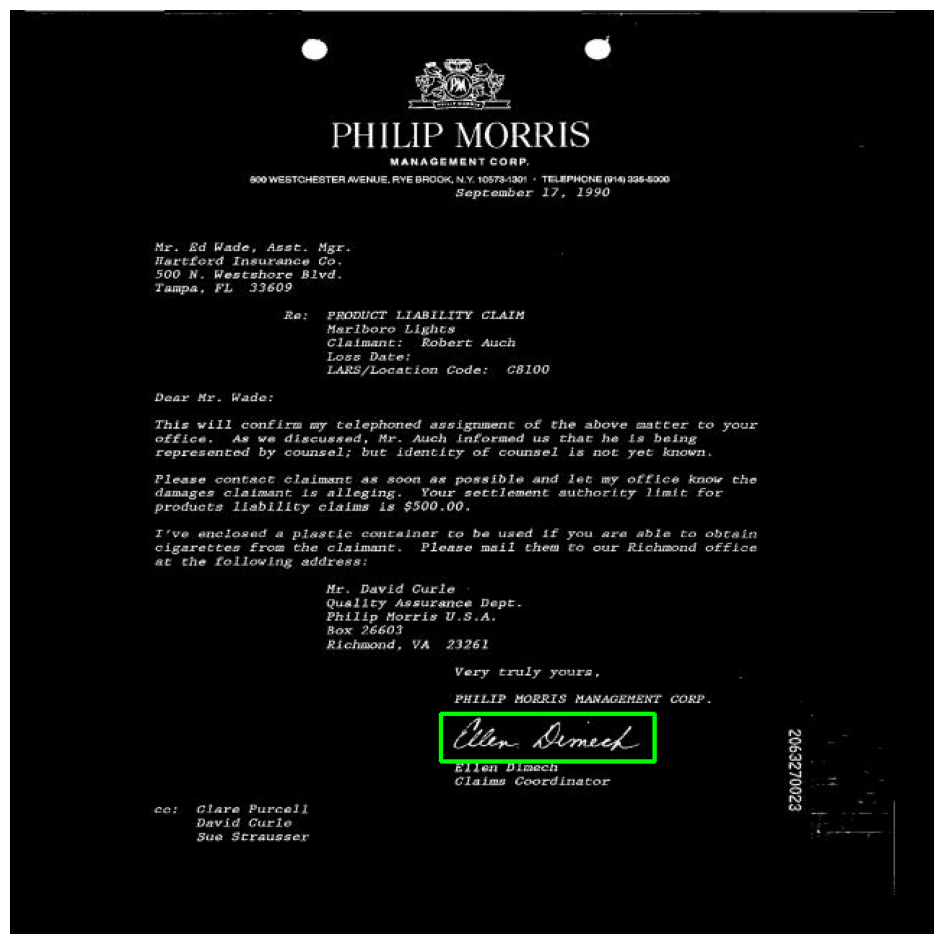


0: 640x640 1 Signature, 1 Text, 6.5ms
Speed: 1.8ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.6213466


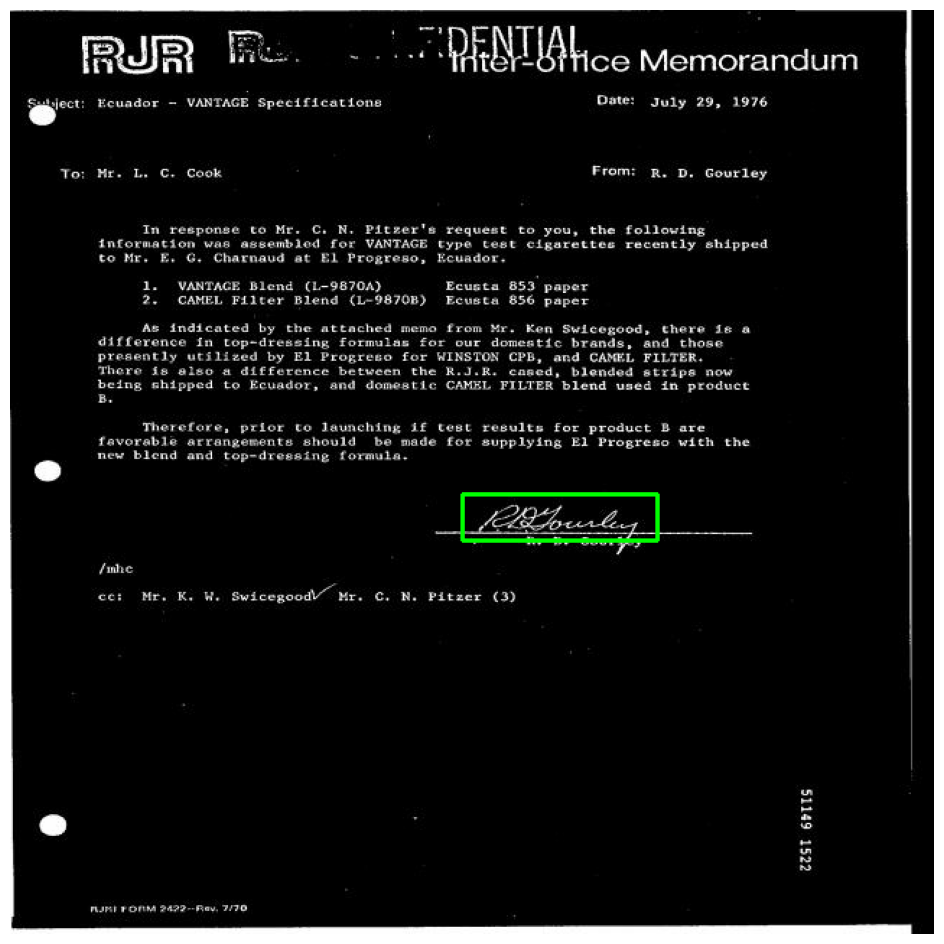


0: 640x640 1 Signature, 1 Text, 7.3ms
Speed: 1.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5898103


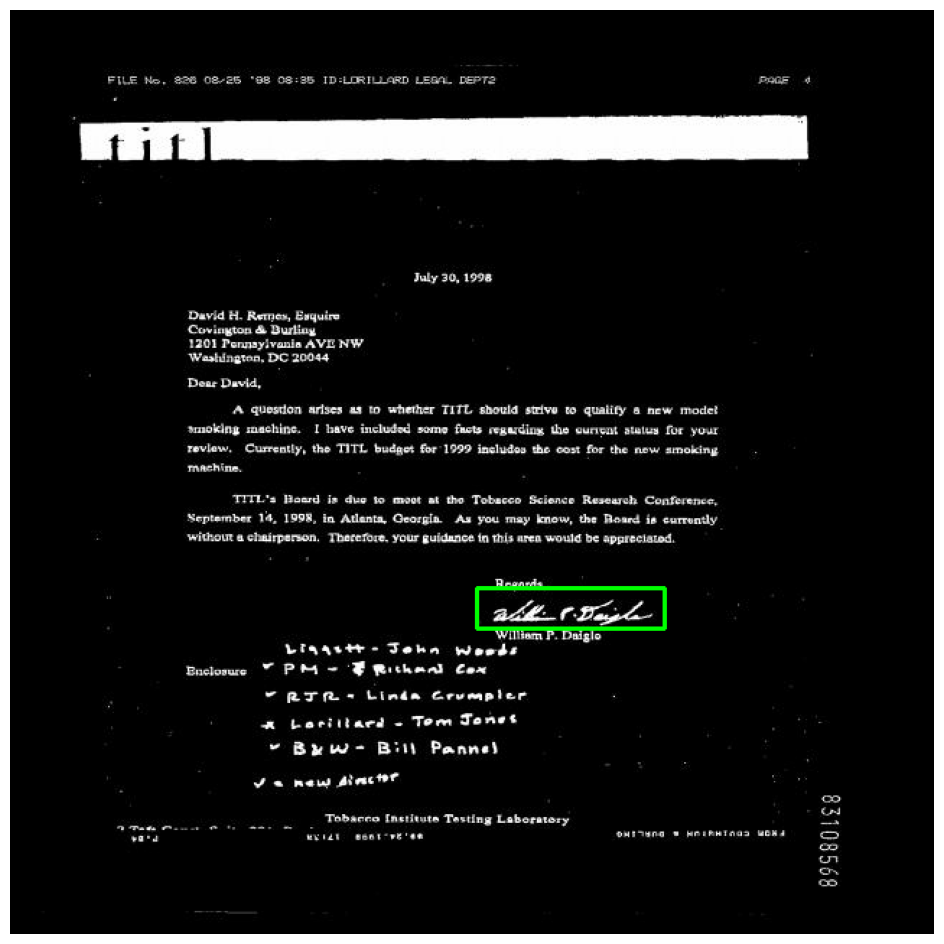


0: 640x640 1 Signature, 1 Text, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.68309957


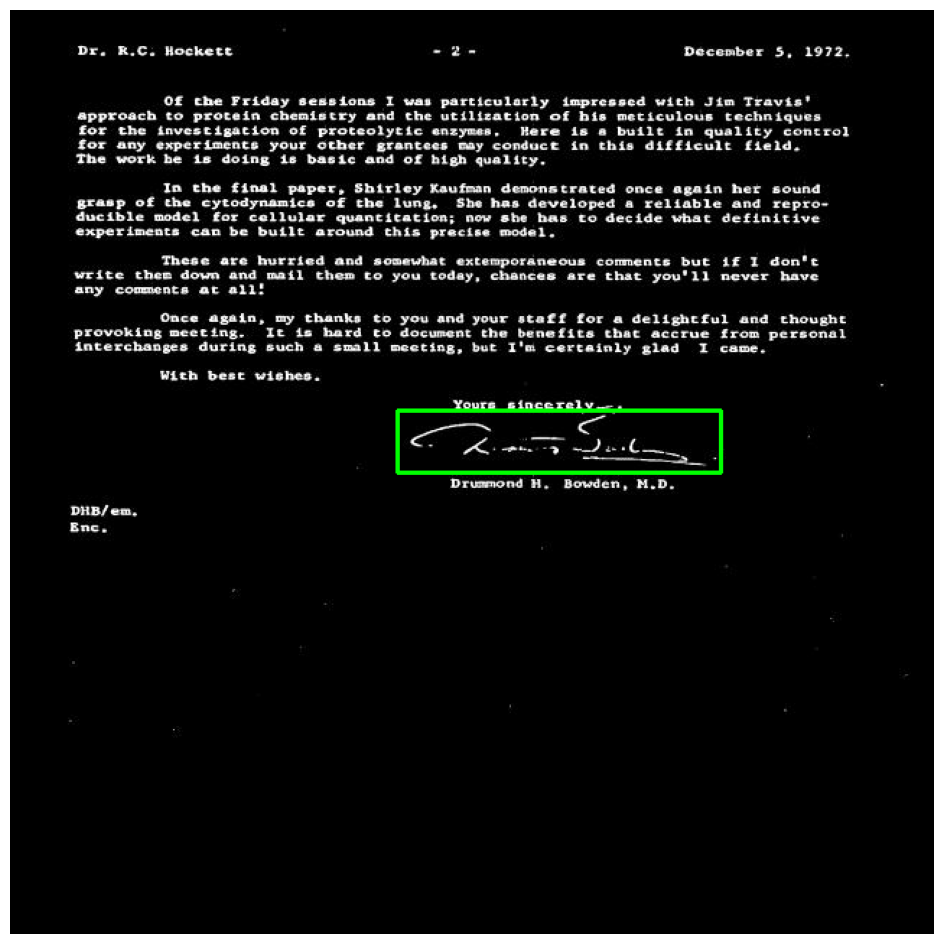


0: 640x640 1 Signature, 6.9ms
Speed: 2.4ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5735338


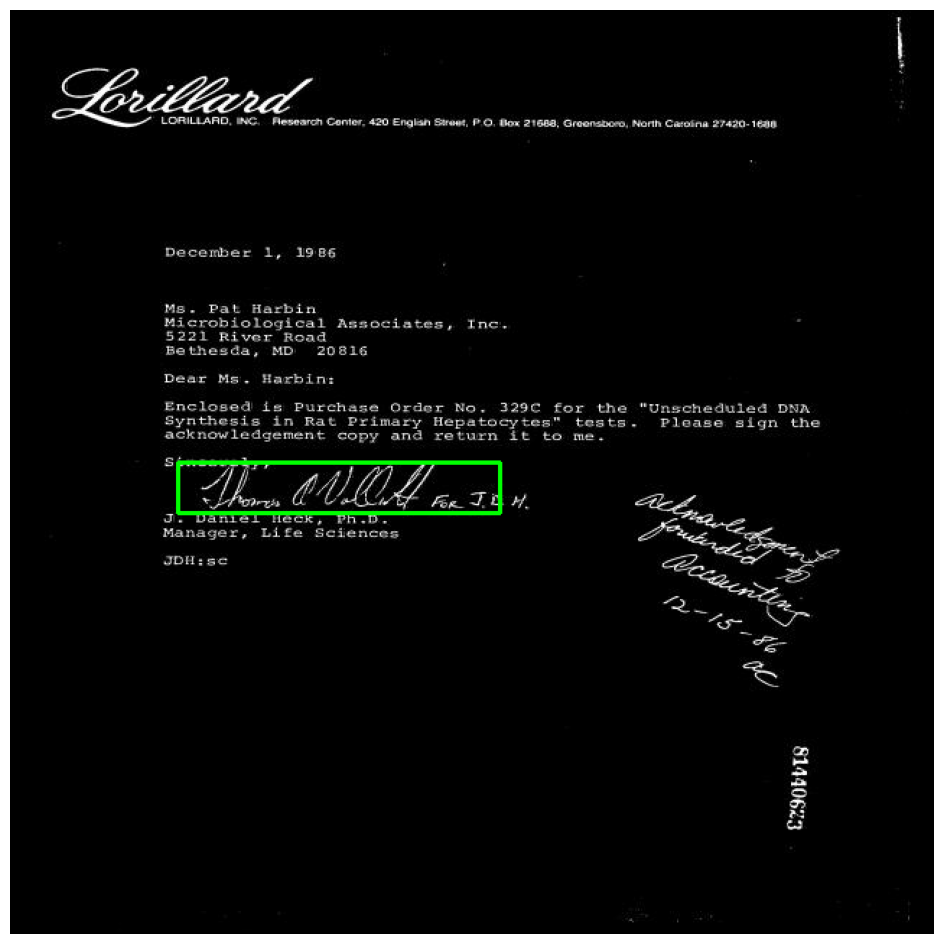


0: 640x640 2 Signatures, 4 Texts, 6.7ms
Speed: 1.8ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5163659


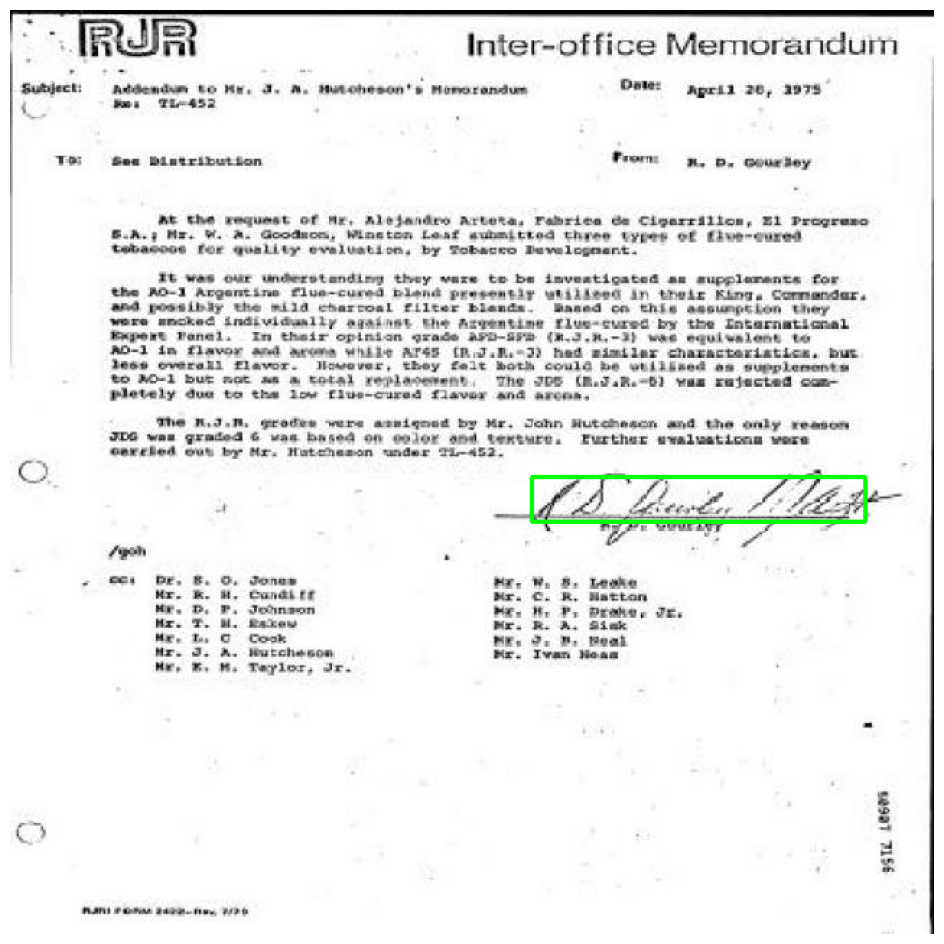


0: 640x640 1 Text, 6.9ms
Speed: 1.9ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Signatures, 6.5ms
Speed: 1.5ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5663893


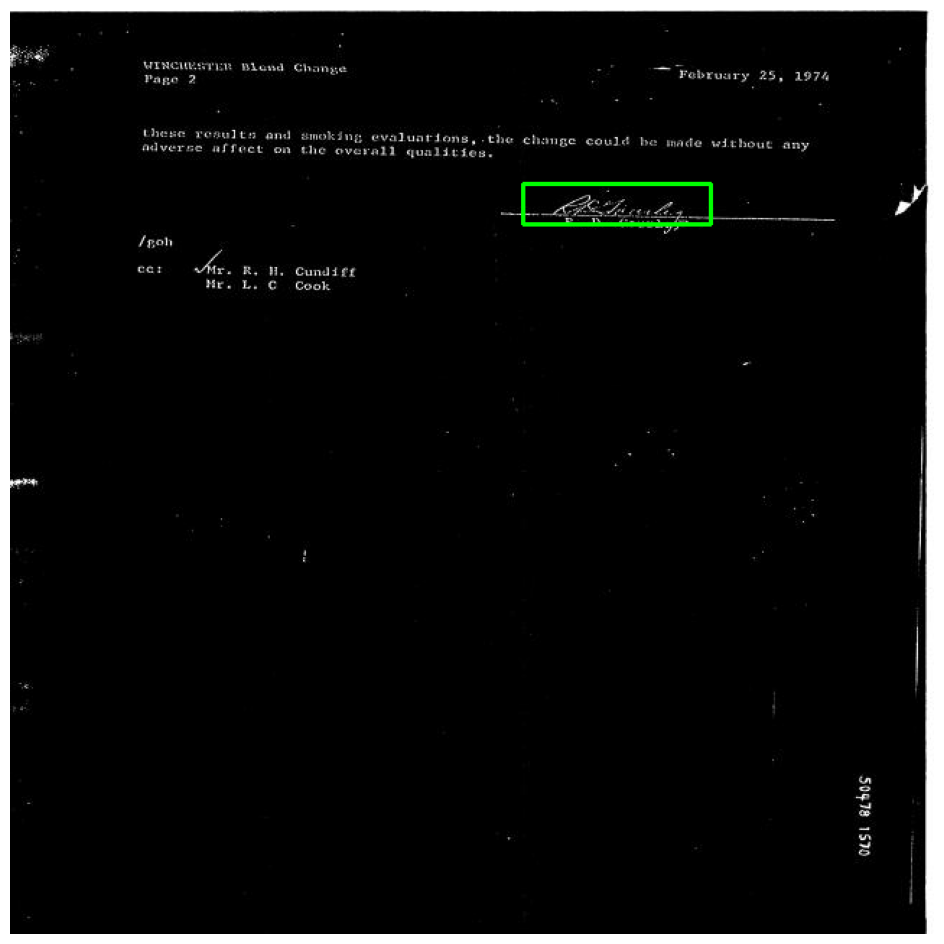


0: 640x640 1 Signature, 1 Text, 6.8ms
Speed: 1.8ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Signatures, 2 Texts, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.70436376


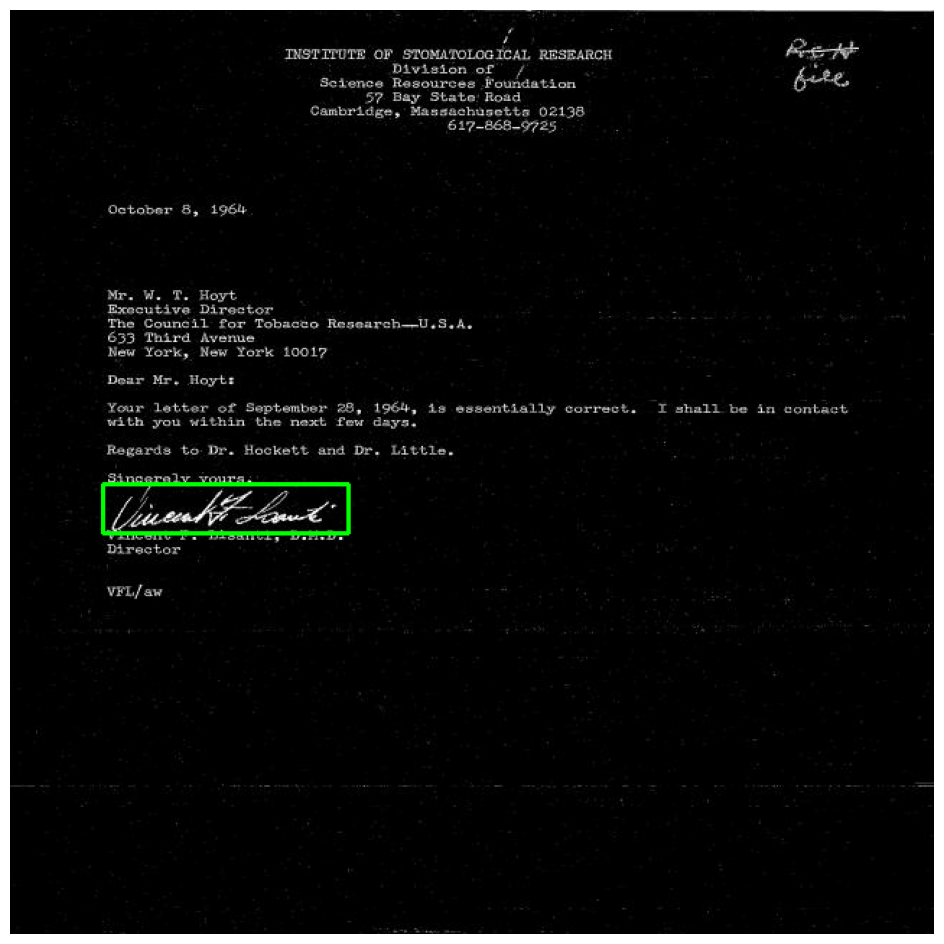


0: 640x640 (no detections), 6.8ms
Speed: 1.9ms preprocess, 6.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5249945


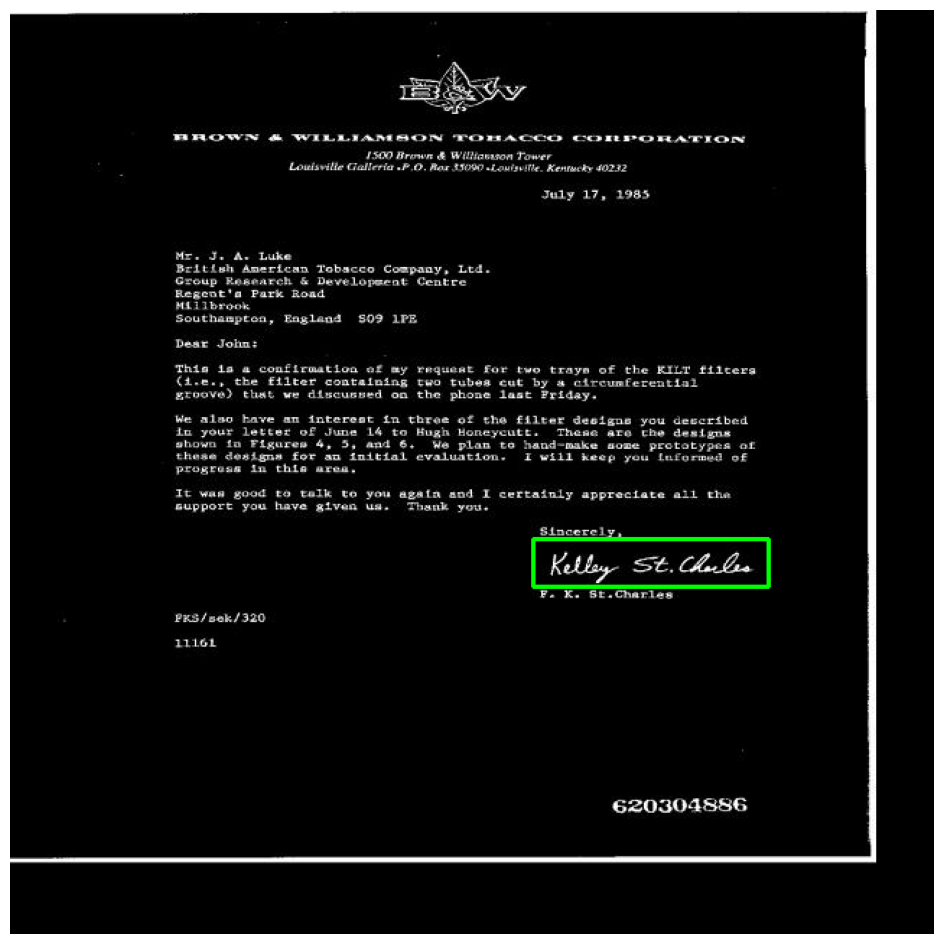


0: 640x640 1 Signature, 7.0ms
Speed: 1.9ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.6492416


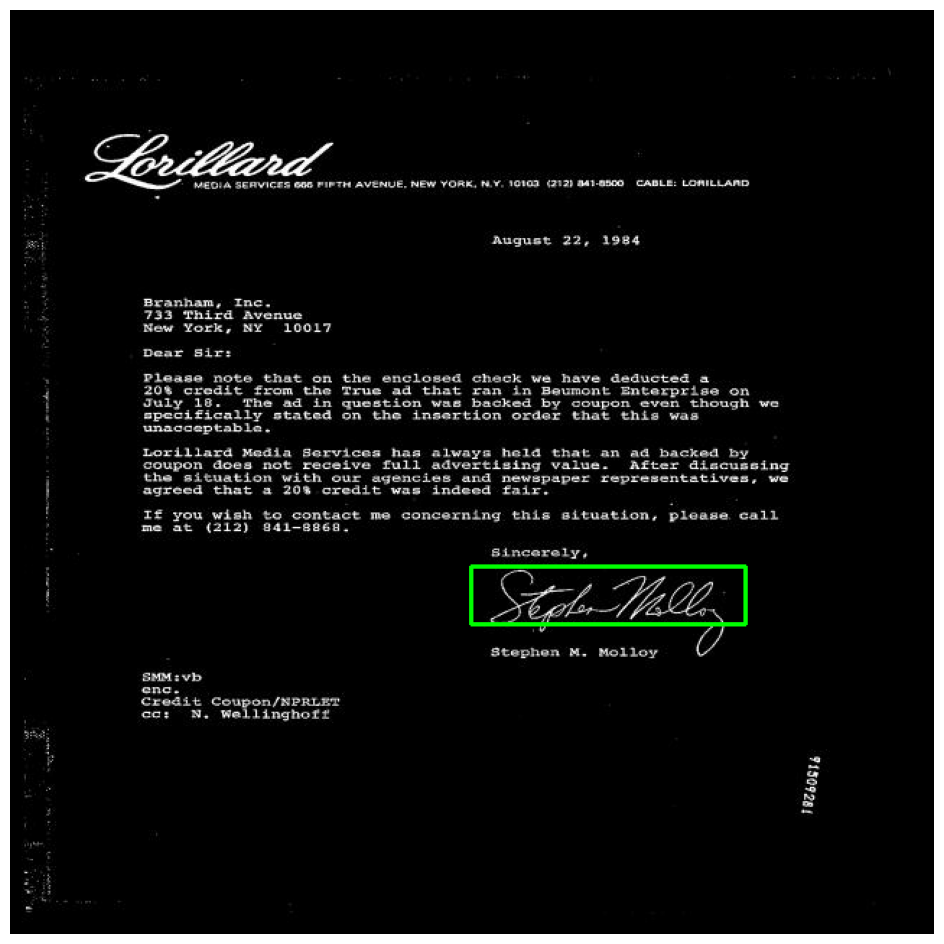


0: 640x640 1 Signature, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.60962445


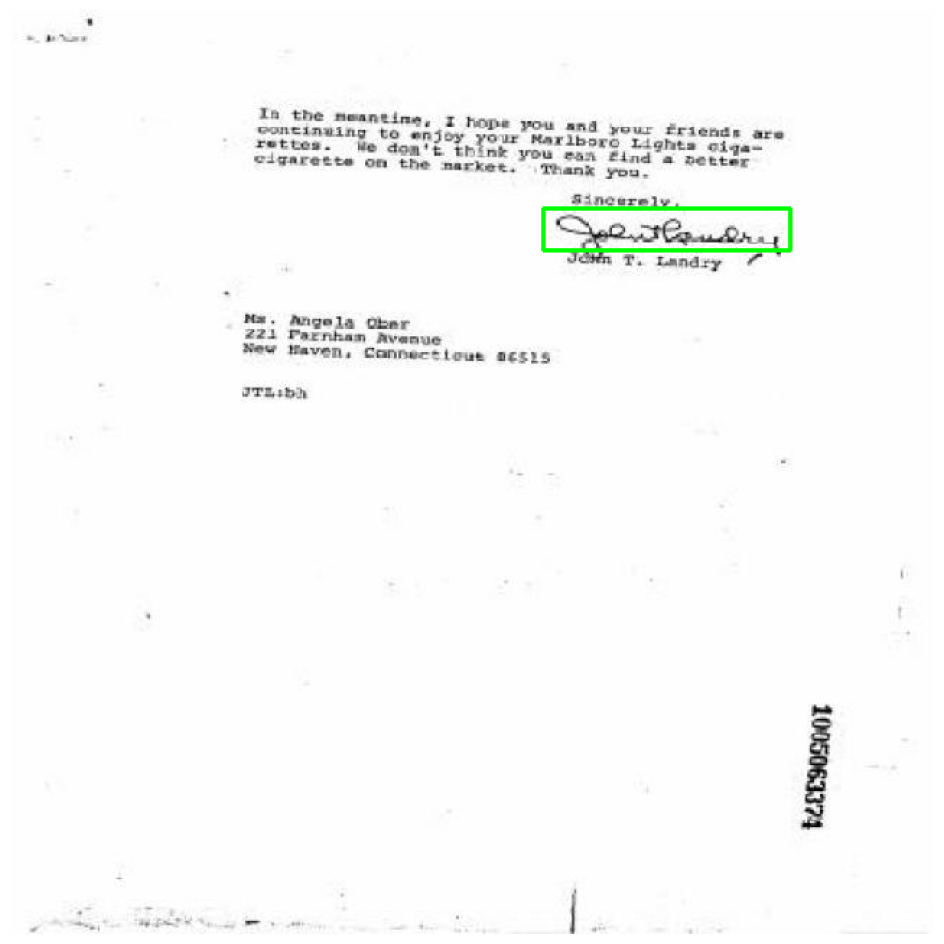


0: 640x640 1 Signature, 7.0ms
Speed: 2.3ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.73296046


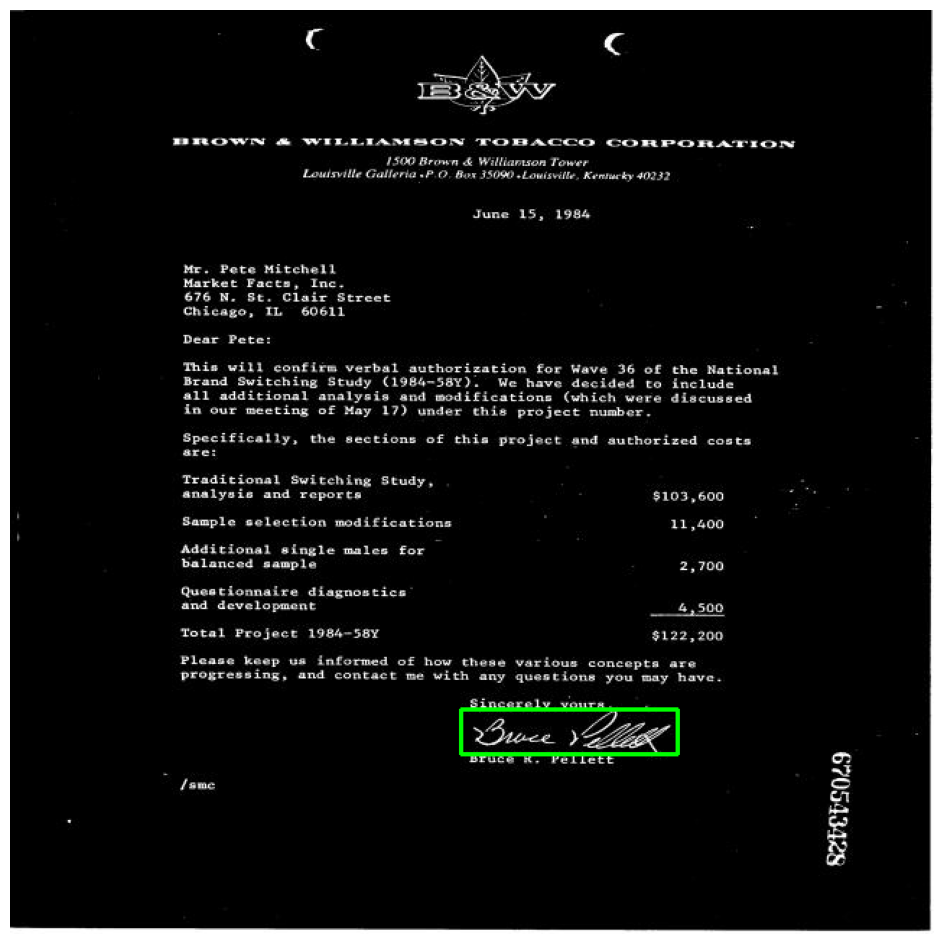


0: 640x640 1 Signature, 7.1ms
Speed: 1.6ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.59756154


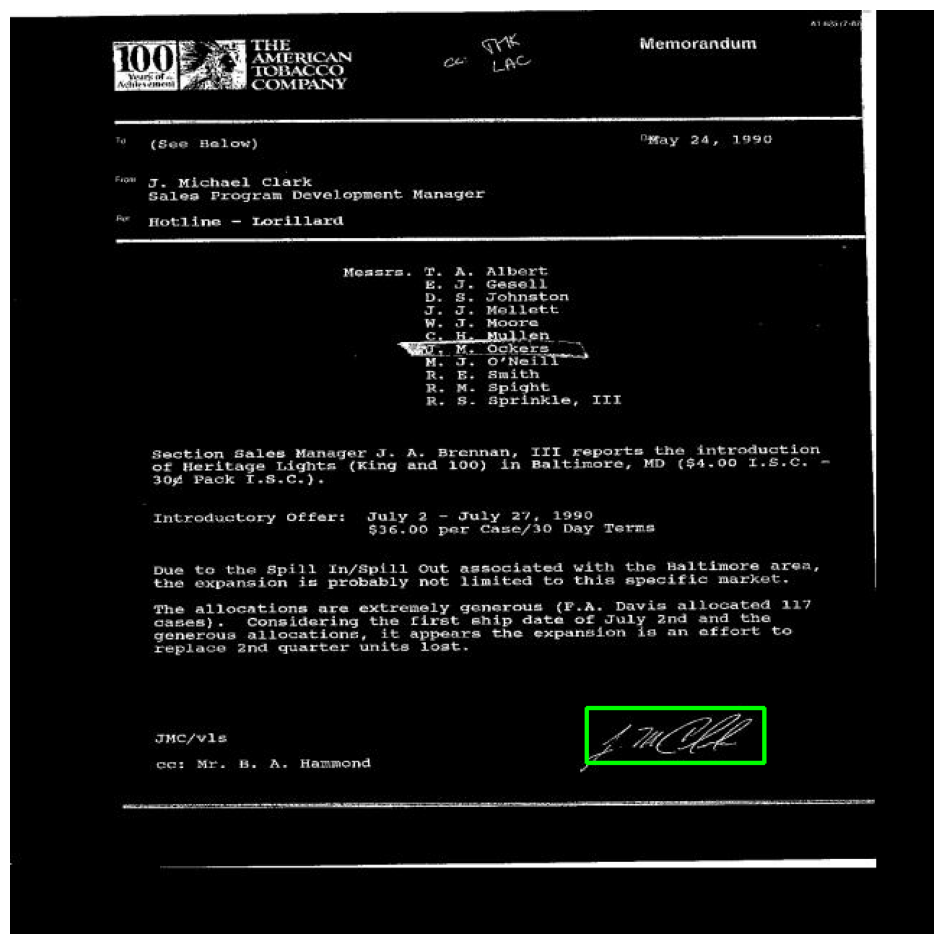


0: 640x640 1 Signature, 7.0ms
Speed: 1.9ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.7068671


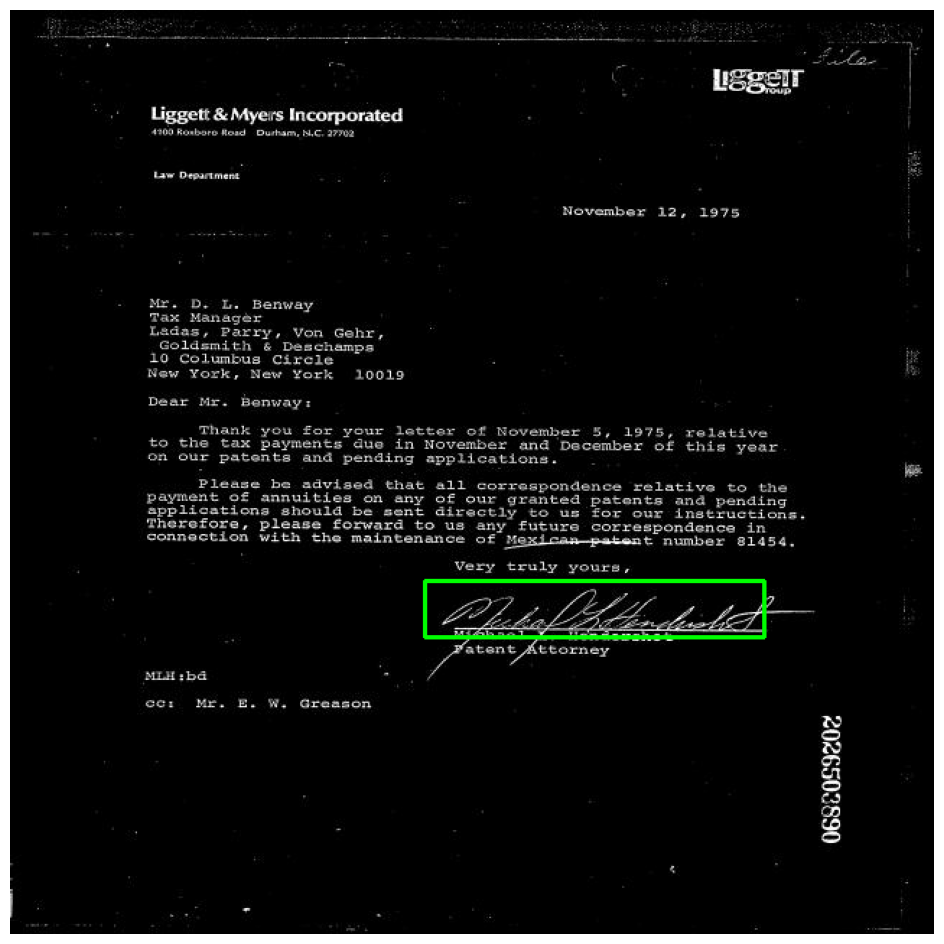


0: 640x640 1 Signature, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.6801844


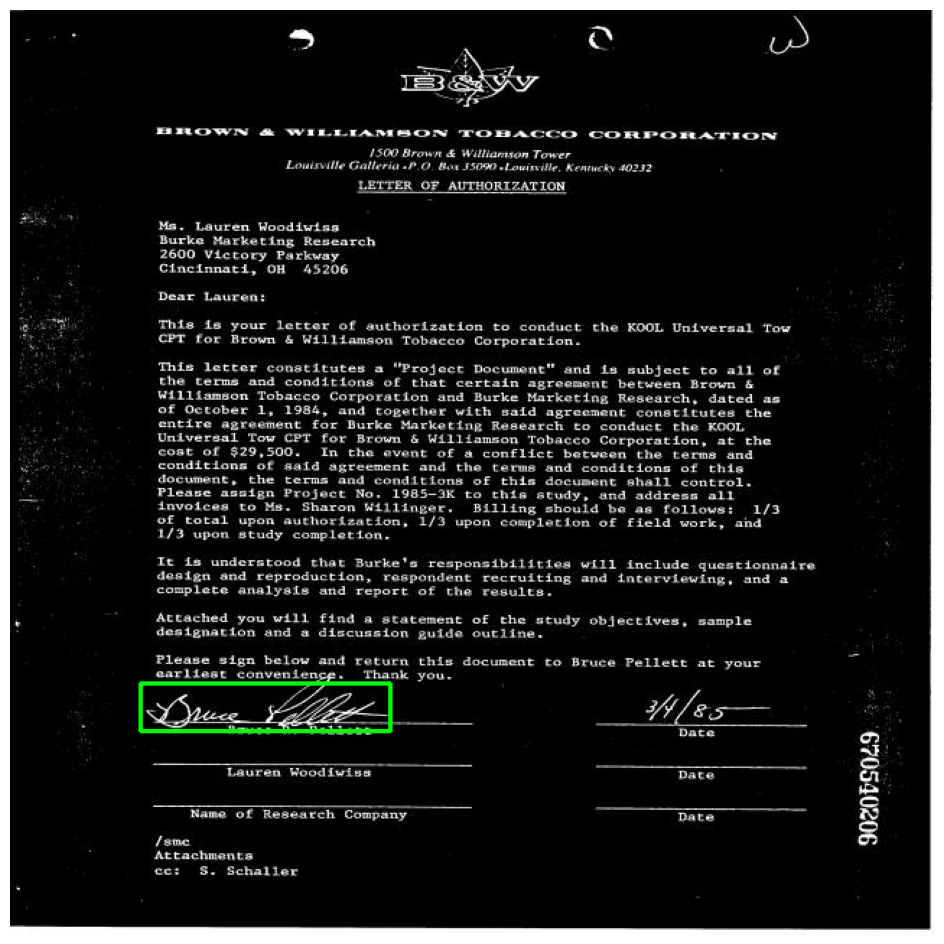


0: 640x640 1 Signature, 2 Texts, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Signatures, 1 Text, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.56366646


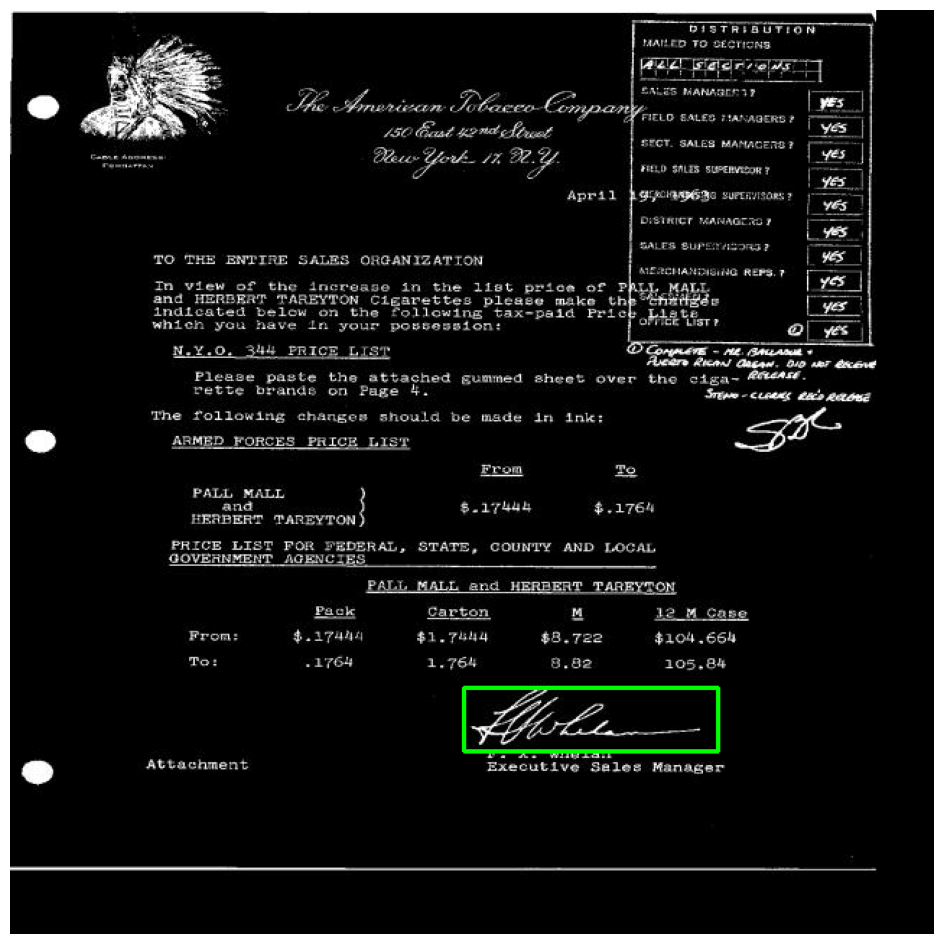


0: 640x640 1 Signature, 1 Text, 6.8ms
Speed: 1.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5523586


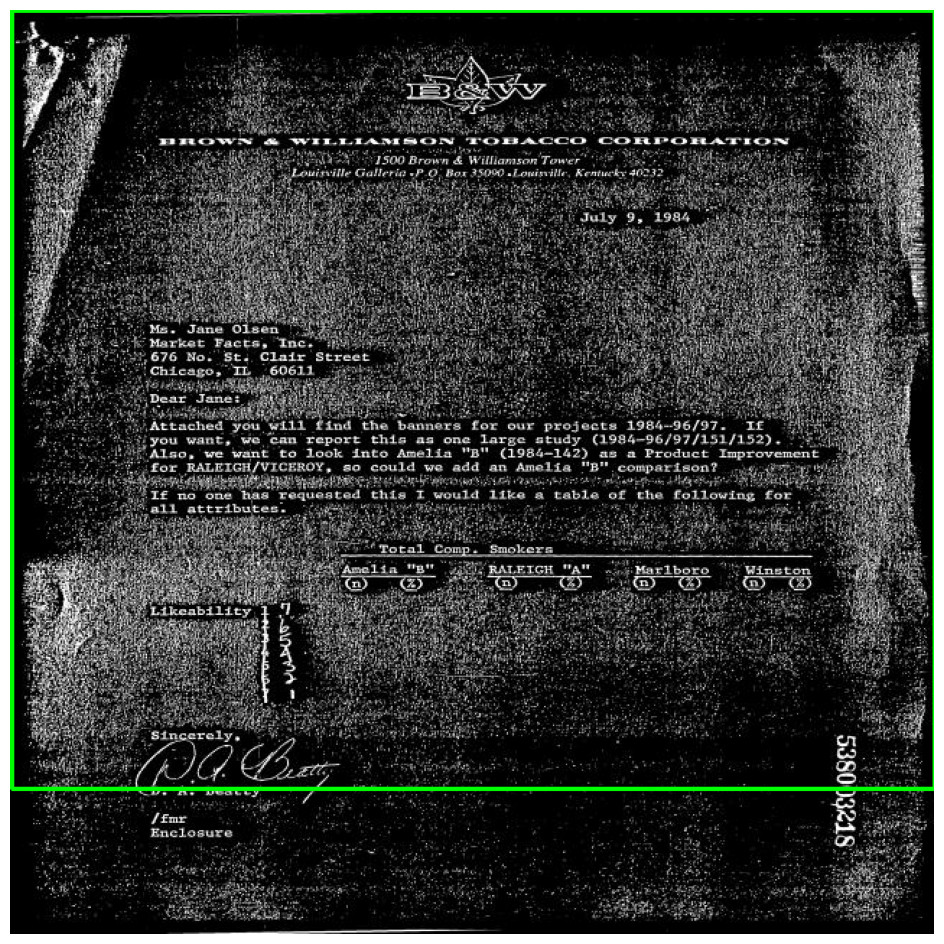


0: 640x640 1 Signature, 9.3ms
Speed: 2.1ms preprocess, 9.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5521436


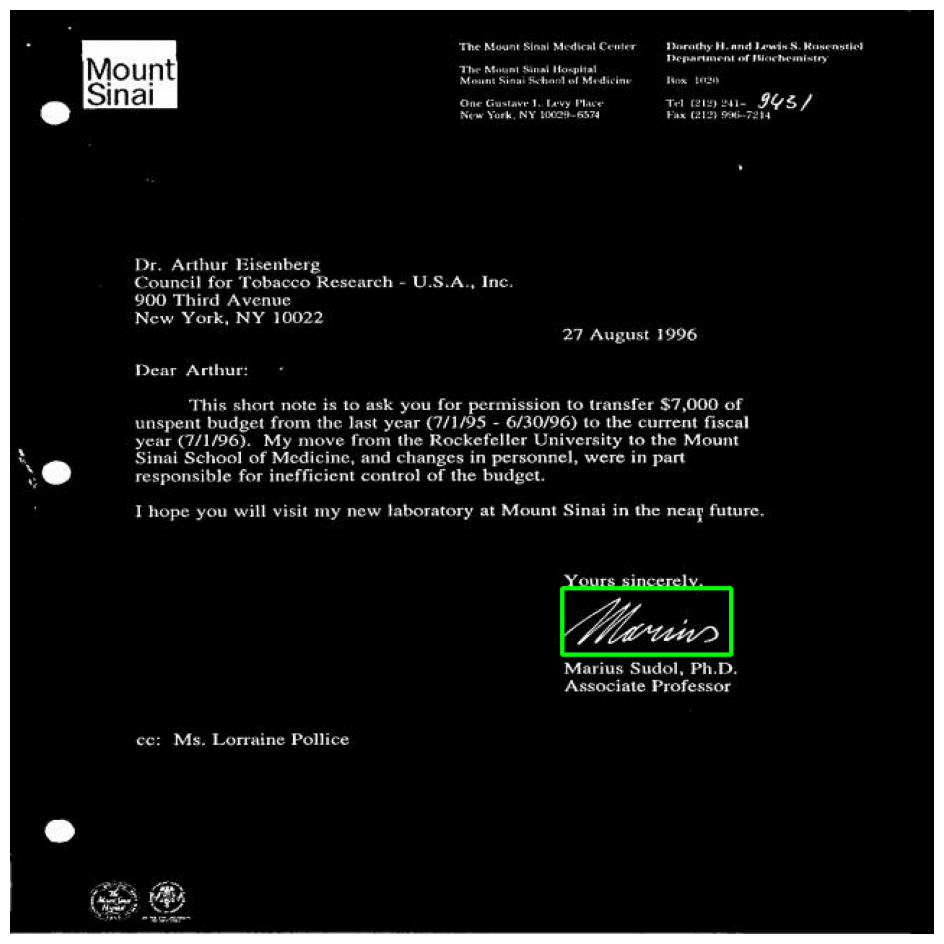


0: 640x640 1 Text, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 1 Text, 6.3ms
Speed: 1.5ms preprocess, 6.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.62734073


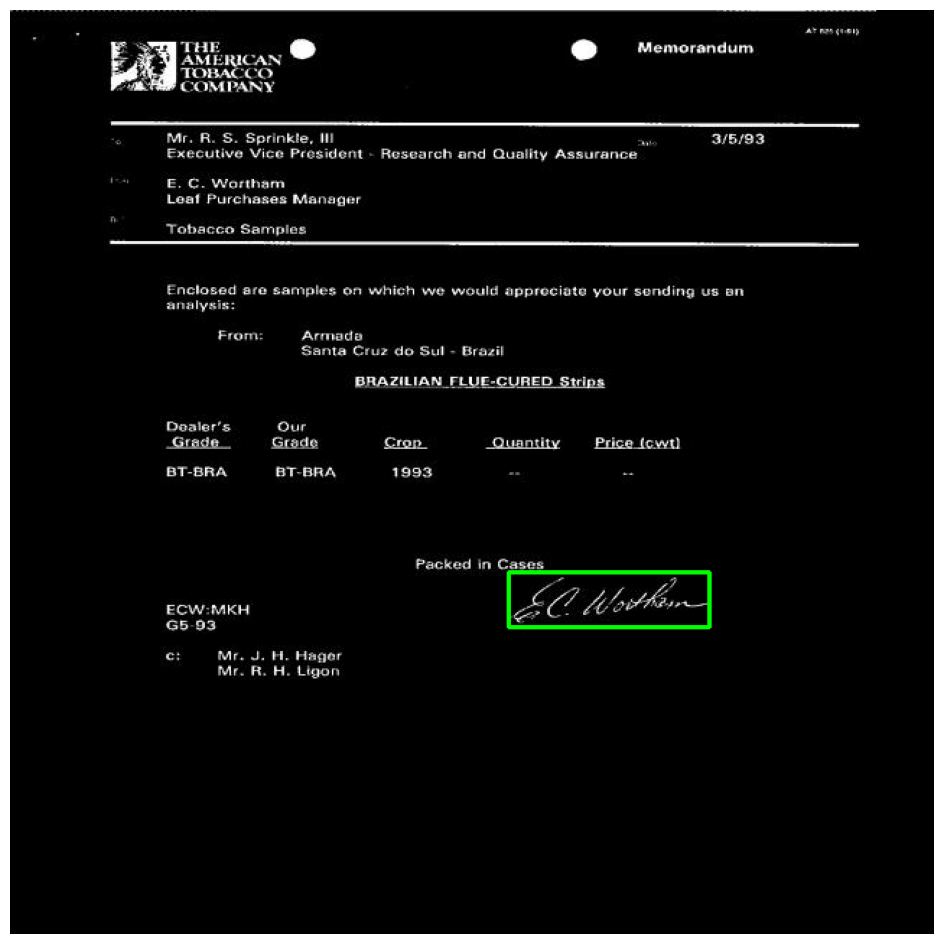


0: 640x640 1 Signature, 6.6ms
Speed: 1.9ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 6.2ms
Speed: 1.6ms preprocess, 6.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.6152863


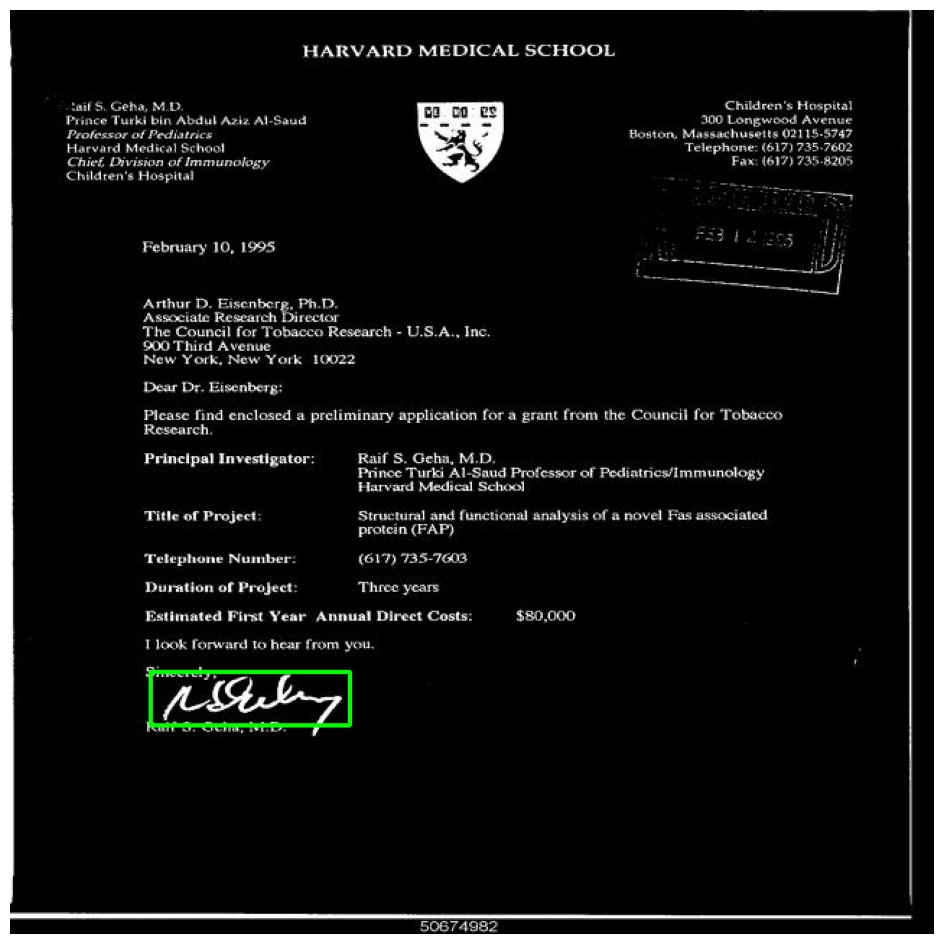


0: 640x640 1 Signature, 6.8ms
Speed: 2.3ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.6361538


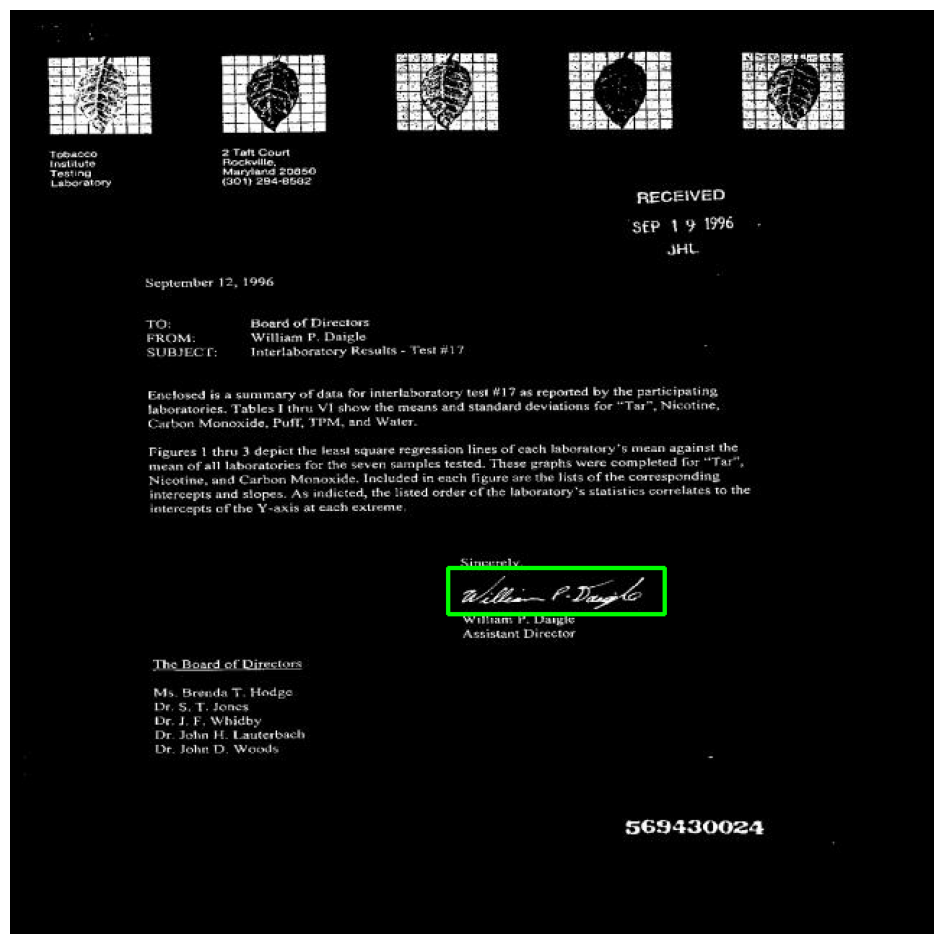


0: 640x640 2 Signatures, 1 Text, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.5328618


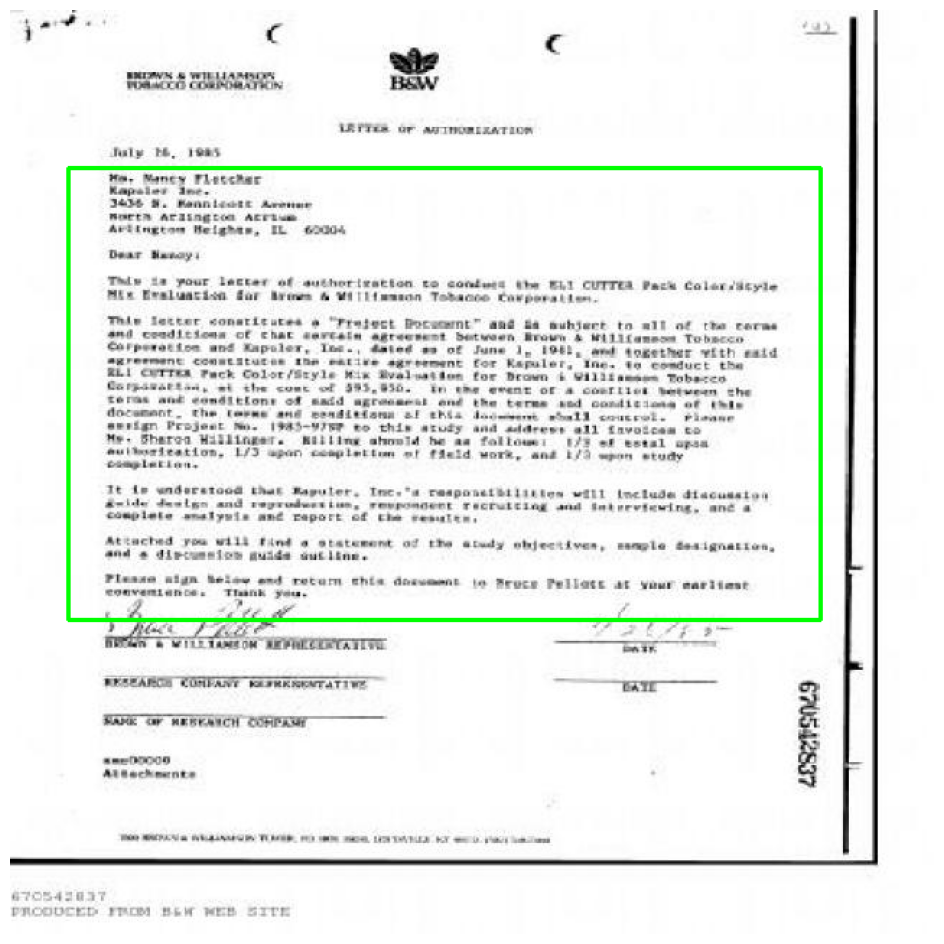


0: 640x640 1 Signature, 1 Text, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.61798733


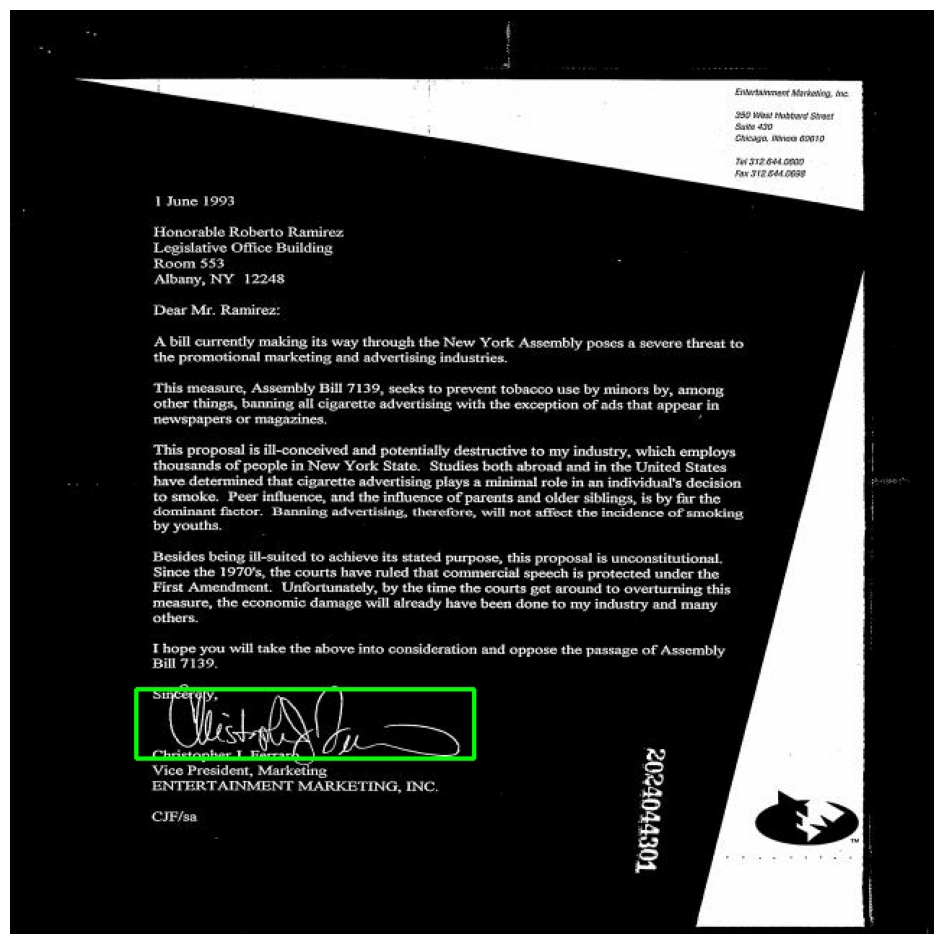


0: 640x640 1 Signature, 1 Text, 6.6ms
Speed: 1.9ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Confidence =  0.62576914


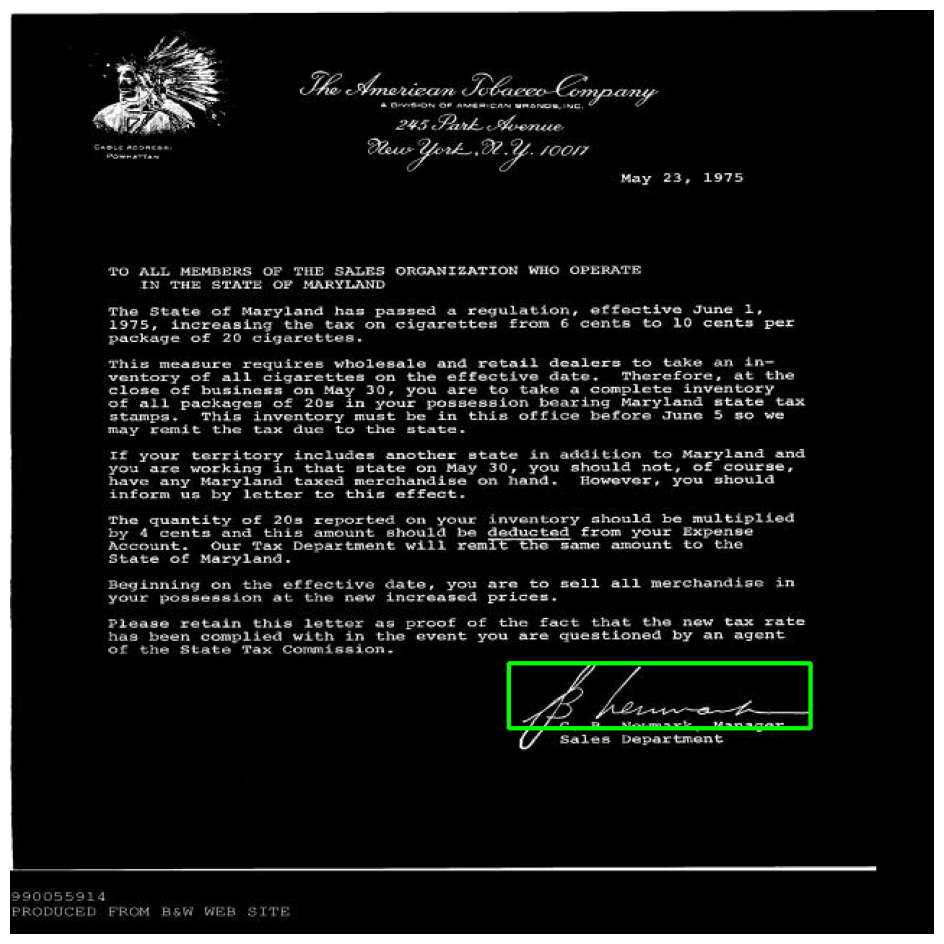


0: 640x640 1 Signature, 2 Texts, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Signature, 1 Text, 6.1ms
Speed: 1.6ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Signatures, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 6.6ms
Speed: 1.6ms preprocess, 6.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


In [19]:
for img_name in test_images: 
    
    img_path = os.path.join('/kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/test/images', img_name)
    img = cv2.imread(img_path)

    pred = model.predict(source=img)[0]   
    detections = sv.Detections.from_ultralytics(pred)   
      
    if (len(detections.xyxy) > 0) and (max(detections.confidence) > 0.5):
            x, y, w, h = detections.xyxy[np.array(detections.confidence).argmax()]
            print("Confidence = ", max(detections.confidence))
            cv2.rectangle(img, (int(x), int(y)), (int(w), int(h)), (0, 255, 0), 2)
            sv.plot_image(img)
    

### **Another Way To Filter The YOLOv8 Bounding Boxes (Detections)**
- https://roboflow.com/how-to-filter-detections/yolov8 

In [ ]:
for img_name in test_images: 
    
    img_path = os.path.join('/kaggle/input/handwritten-signature-detection/Signature detection.v4i.yolov8/test/images', img_name)
    img = cv2.imread(img_path)

    pred = model.predict(source=img)[0]   
    detections = sv.Detections.from_ultralytics(pred)   
    
    detection = detections[detections.confidence > 0.5]    
    bounding_box_annotator = sv.BoundingBoxAnnotator()

    annotated_frame = bounding_box_annotator.annotate(
        scene=img.copy(),
        detections=detection
    )
    print("Confidence: ", detections.confidence)
    sv.plot_image(annotated_frame)

### **Conclusion**

#### **There are small confidences and some mistakes, that is because of the the small size of training dataset which is only 149 training image.**

- https://universe.roboflow.com/amrita-college/signature-detection-xxdzl/dataset/4# 

#### **Soon, I will try on large dataset to make sure if it actually because of the dataset size or another reason i didn't get.**